In [1]:
from ax.service.ax_client import AxClient
from ax import plot
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.modelbridge.cross_validation import cross_validate
from ax.plot.diagnostic import interact_cross_validation

init_notebook_plotting()

[INFO 05-28 14:05:06] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [2]:
%matplotlib widget
from matplotlib import pyplot as plt
from time import sleep
import numpy as np


def display_immediately(fig):
    canvas = fig.canvas
    display(canvas)
    canvas._handle_message(canvas, {"type": "send_image_mode"}, [])
    canvas._handle_message(canvas, {"type": "refresh"}, [])
    canvas._handle_message(canvas, {"type": "initialized"}, [])
    canvas._handle_message(canvas, {"type": "draw"}, [])


def generate_updating_fig():
    with plt.ioff():
        fig, ax = plt.subplots(figsize=(12, 3))

    display_immediately(fig)
    return fig, ax

In [3]:
import os

import numpy as np
from centrex_trajectories import (
    Coordinates,
    Gravity,
    PropagationType,
    Velocities,
    propagate_trajectories,
    PropagationOptions,
)
from centrex_trajectories.particles import TlF
from centrex_trajectories.beamline_objects import (
    CircularAperture,
    ElectrostaticQuadrupoleLens,
    RectangularAperture,
    Section,
)

In [4]:
n_trajectories = 5_000_000
options = PropagationOptions(verbose=False, n_cores=8)
particle = TlF()
gravity = Gravity(0, -9.81 * particle.mass, 0)

In [5]:
from rich.progress import (
    Progress,
    TextColumn,
    TimeElapsedColumn,
    SpinnerColumn,
    BarColumn,
    TimeRemainingColumn,
    TaskProgressColumn,
    ProgressColumn,
)

In [6]:
class TaskSpeed(ProgressColumn):
    def render(self, task):
        if task.speed is None:
            return ""
        elif task.speed >= 0.1:
            return f"{( task.speed or 0 ):.1f}/s"
        else:
            return f"{( 1 / task.speed or 0):.1f} s/i"

In [7]:
fourK = Section(
    name="4K shield",
    objects=[CircularAperture(0, 0, 1.75 * 0.0254, 0.0254 / 2)],
    start=0,
    stop=(1.75 + 0.25) * 0.0254,
    save_collisions=False,
    propagation_type=PropagationType.ballistic,
)
fourtyK = Section(
    name="40K shield",
    objects=[CircularAperture(0, 0, fourK.stop + 1.25 * 0.0254, 0.0254 / 2)],
    start=fourK.stop,
    stop=fourK.stop + (1.25 + 0.25) * 0.0254,
    save_collisions=False,
    propagation_type=PropagationType.ballistic,
)
bbexit = Section(
    name="Beamsource Exit",
    objects=[CircularAperture(0, 0, fourtyK.stop + 2.5 * 0.0254, 2 * 0.0254)],
    start=fourtyK.stop,
    stop=fourtyK.stop + (2.5 + 0.75) * 0.0254,
    save_collisions=False,
    propagation_type=PropagationType.ballistic,
)

In [8]:
def generate_progress():
    return Progress(
        SpinnerColumn(),
        TextColumn("{task.description}", justify="right"),
        BarColumn(bar_width=None),
        TaskProgressColumn(show_speed=True),
        TaskSpeed(),
        "•",
        TextColumn("{task.completed} of {task.total}"),
        "•",
        TextColumn("{task.fields[mean]:.1f}+/-{task.fields[sem]:.1f}", justify="right"),
        "•",
        TimeElapsedColumn(),
        TimeRemainingColumn(),
    )

In [9]:
# origin = Coordinates(
#     x = np.random.randn(n_trajectories) * 1.5e-3,
#     y = np.random.randn(n_trajectories) * 1.5e-3,
#     z = np.zeros(n_trajectories),
# )
# velocities = Velocities(
#     vx = np.random.randn(n_trajectories) * 39.4,
#     vy = np.random.randn(n_trajectories) * 39.4,
#     vz = np.random.randn(n_trajectories) * 16 + 184,
# )

In [10]:
def run_beamline(L, V, R):
    origin = Coordinates(
        x=np.random.randn(n_trajectories) * 1.5e-3,
        y=np.random.randn(n_trajectories) * 1.5e-3,
        z=np.zeros(n_trajectories),
    )
    velocities = Velocities(
        vx=np.random.randn(n_trajectories) * 39.4,
        vy=np.random.randn(n_trajectories) * 39.4,
        vz=np.random.randn(n_trajectories) * 16 + 184,
    )

    spa = Section(
        name="State Prep A",
        objects=[
            CircularAperture(0, 0, bbexit.stop + 19.6 * 0.0254, R),
            CircularAperture(
                0,
                0,
                bbexit.stop + (19.6 + 0.375 + 9.625) * 0.0254,
                R,
            ),
        ],
        start=bbexit.stop,
        stop=bbexit.stop + (19.6 + 0.375 + 9.625 + 0.375) * 0.0254,
        save_collisions=False,
        propagation_type=PropagationType.ballistic,
    )
    eql = ElectrostaticQuadrupoleLens(
        name="Electrostatic Lens",
        objects=[],
        start=1.01,
        stop=1.01 + L,
        V=V,
        R=R,
        save_collisions=False,
    )
    interaction = Section(
        name="Interaction",
        objects=[RectangularAperture(0, 0, eql.stop + 0.82 + 0.1, 0.03, 0.03)],
        start=eql.stop + 0.82,
        stop=eql.stop + 0.82 + 3,
        save_collisions=False,
        propagation_type=PropagationType.ballistic,
        force=None,
    )
    det = Section(
        name="Detection",
        objects=[
            RectangularAperture(0, 0, interaction.stop + 1.01 + 0.001, 0.03, 0.03)
        ],
        start=interaction.stop + 1.01,
        stop=interaction.stop + 1.01 + 0.01,
        save_collisions=False,
        propagation_type=PropagationType.ballistic,
        force=None,
    )
    # sections = [fourK, fourtyK, bbexit, spa, interaction, det]
    sections = [fourK, fourtyK, bbexit, spa, eql, interaction, det]
    section_data, trajectories = propagate_trajectories(
        sections,
        origin,
        velocities,
        particle,
        gravity=gravity,
        options=options,
    )
    detected = section_data[-1].nr_trajectories - section_data[-1].nr_collisions
    return detected

In [11]:
def evaluate(parameters):
    L, V, R = parameters.get("L"), parameters.get("V"), parameters.get("R")
    # V = parameters.get("V")
    detected = run_beamline(L, V, R)
    return {"detected_particles": (detected, np.sqrt(detected))}

In [12]:
ax_client = AxClient()
ax_client.create_experiment(
    name="optimize CeNTREX lens",
    parameters=[
        {"name": "L", "type": "fixed", "value": 0.6, "value_type": "float"},
        {"name": "V", "type": "range", "bounds": [0, 30e3], "value_type": "float"},
        {
            "name": "R",
            "type": "fixed",
            "value": 1.75 * 0.0254 / 2,
            "value_type": "float",
        },
    ],
    objective_name="detected_particles",
    minimize=False,
)

[INFO 05-28 14:05:08] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 05-28 14:05:08] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[FixedParameter(name='L', parameter_type=FLOAT, value=0.6), RangeParameter(name='V', parameter_type=FLOAT, range=[0.0, 30000.0]), FixedParameter(name='R', parameter_type=FLOAT, value=0.022224999999999998)], parameter_constraints=[]).
[INFO 05-28 14:05:08] ax.modelbridge.dispatch_utils: Using Bayesian optimization since there are more ordered parameters than there are categories for the unordered categorical parameters.
[INFO 05-28 14:05:08] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 5 trials, GPEI for subsequent trials]). Iterations after 5 will take longer to generate due to  mo

In [13]:
def plot_progress(fig, ax, opt_trace):
    dat = opt_trace.data["data"][0]
    layout = opt_trace.data["layout"]

    ax.clear()
    ax.grid(True)
    x, y = dat["x"], dat["y"]
    ax.plot(x, y, lw=2)
    ax.set_xlabel(layout["xaxis"]["title"]["text"])
    ax.set_ylabel(layout["yaxis"]["title"]["text"])
    ax.set_title(layout["title"]["text"])
    fig.tight_layout()
    fig.canvas.draw()
    fig.canvas.flush_events()

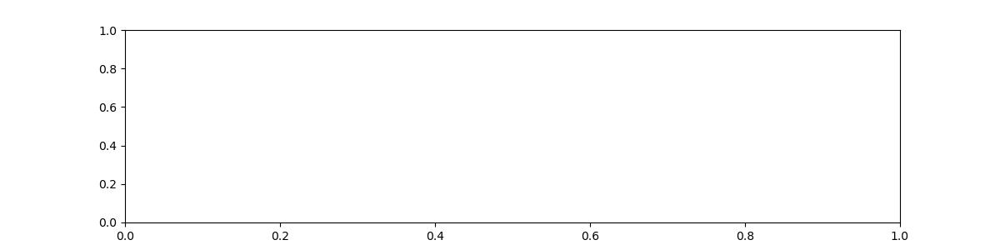

Output()

[INFO 05-28 14:05:08] ax.service.ax_client: Generated new trial 0 with parameters {'V': 22790.58516, 'L': 0.6, 'R': 0.022225}.
[INFO 05-28 14:05:32] ax.service.ax_client: Completed trial 0 with data: {'detected_particles': (10128, 100.637965)}.
[INFO 05-28 14:05:32] ax.service.ax_client: Generated new trial 1 with parameters {'V': 15849.311482, 'L': 0.6, 'R': 0.022225}.
[INFO 05-28 14:05:50] ax.service.ax_client: Completed trial 1 with data: {'detected_particles': (1487, 38.561639)}.
[INFO 05-28 14:05:50] ax.service.ax_client: Generated new trial 2 with parameters {'V': 4678.095952, 'L': 0.6, 'R': 0.022225}.
[INFO 05-28 14:06:05] ax.service.ax_client: Completed trial 2 with data: {'detected_particles': (401, 20.024984)}.
[INFO 05-28 14:06:05] ax.service.ax_client: Generated new trial 3 with parameters {'V': 4478.910556, 'L': 0.6, 'R': 0.022225}.
[INFO 05-28 14:06:21] ax.service.ax_client: Completed trial 3 with data: {'detected_particles': (423, 20.566964)}.
[INFO 05-28 14:06:21] ax.se

In [14]:
fig, ax = generate_updating_fig()

nr_iterations = 10
with generate_progress() as prog:
    task = prog.add_task(
        "[bold blue]Bayesian Optimization", total=nr_iterations, mean=0, sem=0
    )
    for i in range(nr_iterations):
        parameters, trial_index = ax_client.get_next_trial()
        # Local evaluation here can be replaced with deployment to external system.
        ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))
        idx = ax_client.get_best_trial(use_model_predictions=False)[0]
        # trial = ax_client.experiment.data_by_trial[idx]
        trial = list(ax_client.experiment.data_by_trial.values())[-1]
        trial_data = list(trial.values())[0].df
        prog.update(
            task,
            advance=1,
            mean=trial_data["mean"].values[0],
            sem=trial_data["sem"].values[0],
        )
        opt_trace = ax_client.get_optimization_trace()
        plot_progress(fig, ax, opt_trace)
    prog.refresh()

model = ax_client.generation_strategy.model

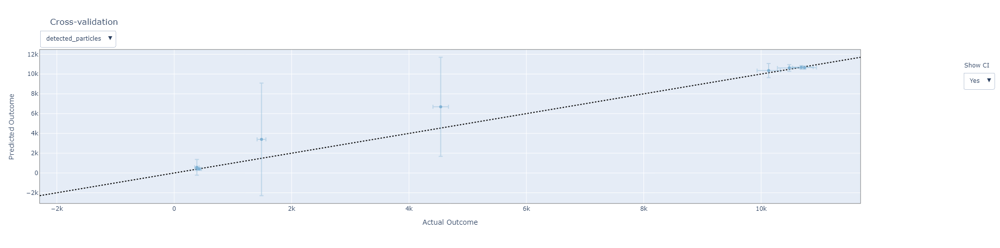

In [15]:
cv_results = cross_validate(model)
render(interact_cross_validation(cv_results))

In [16]:
ax_client.generation_strategy.trials_as_df

[INFO 05-28 14:08:32] ax.modelbridge.generation_strategy: Note that parameter values in dataframe are rounded to 2 decimal points; the values in the dataframe are thus not the exact ones suggested by Ax in trials.


,Generation Step,Generation Model,Trial Index,Trial Status,Arm Parameterizations
0,0,Sobol,0,COMPLETED,"{'0_0': {'V': 22790.59, 'L': 0.6, 'R': 0.02}}"
1,0,Sobol,1,COMPLETED,"{'1_0': {'V': 15849.31, 'L': 0.6, 'R': 0.02}}"
2,0,Sobol,2,COMPLETED,"{'2_0': {'V': 4678.1, 'L': 0.6, 'R': 0.02}}"
3,0,Sobol,3,COMPLETED,"{'3_0': {'V': 4478.91, 'L': 0.6, 'R': 0.02}}"
4,0,Sobol,4,COMPLETED,"{'4_0': {'V': 2981.68, 'L': 0.6, 'R': 0.02}}"
5,1,GPEI,5,COMPLETED,"{'5_0': {'V': 30000.0, 'L': 0.6, 'R': 0.02}}"
6,1,GPEI,6,COMPLETED,"{'6_0': {'V': 24316.52, 'L': 0.6, 'R': 0.02}}"
7,1,GPEI,7,COMPLETED,"{'7_0': {'V': 24913.08, 'L': 0.6, 'R': 0.02}}"
8,1,GPEI,8,COMPLETED,"{'8_0': {'V': 24049.21, 'L': 0.6, 'R': 0.02}}"
9,1,GPEI,9,COMPLETED,"{'9_0': {'V': 24174.27, 'L': 0.6, 'R': 0.02}}"


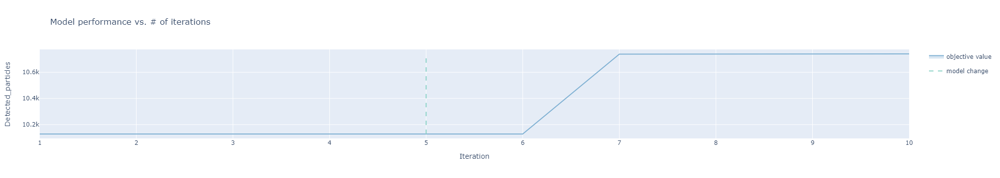

In [17]:
render(ax_client.get_optimization_trace())

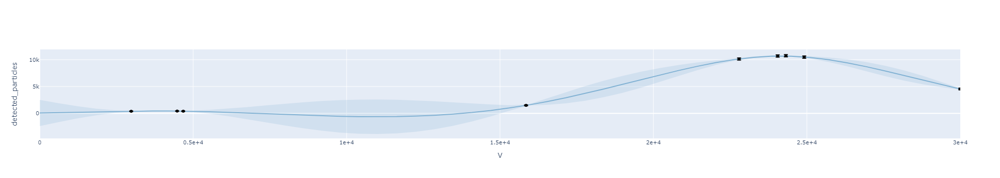

In [18]:
from ax.plot.slice import plot_slice

render(plot_slice(model, "V", "detected_particles"))

In [19]:
from ax.modelbridge.generation_strategy import GenerationStrategy, GenerationStep
from ax.modelbridge.registry import Models, ModelRegistryBase
from ax.modelbridge.dispatch_utils import choose_generation_strategy

In [20]:
gs = GenerationStrategy(
    steps=[
        # 1. Initialization step (does not require pre-existing data and is well-suited for
        # initial sampling of the search space)
        GenerationStep(
            model=Models.SOBOL,
            num_trials=10,  # How many trials should be produced from this generation step
            min_trials_observed=3,  # How many trials need to be completed to move to next model
            max_parallelism=5,  # Max parallelism for this step
            model_kwargs={"seed": 999},  # Any kwargs you want passed into the model
            model_gen_kwargs={},  # Any kwargs you want passed to `modelbridge.gen`
        ),
        # 2. Bayesian optimization step (requires data obtained from previous phase and learns
        # from all data available at the time of each new candidate generation call)
        GenerationStep(
            model=Models.GPEI,
            num_trials=-1,  # No limitation on how many trials should be produced from this step
            max_parallelism=3,  # Parallelism limit for this step, often lower than for Sobol
            # More on parallelism vs. required samples in BayesOpt:
            # https://ax.dev/docs/bayesopt.html#tradeoff-between-parallelism-and-total-number-of-trials
        ),
    ]
)

In [21]:
ax_client = AxClient(generation_strategy=gs, verbose_logging=False)
ax_client.create_experiment(
    name="optimize CeNTREX lens",
    parameters=[
        {"name": "L", "type": "range", "bounds": [0.1, 1.0], "value_type": "float"},
        {"name": "V", "type": "range", "bounds": [0, 30e3], "value_type": "float"},
        {
            "name": "R",
            "type": "fixed",
            "value": 1.75 * 0.0254 / 2,
            "value_type": "float",
        },
    ],
    objective_name="detected_particles",
    minimize=False,
)

[INFO 05-28 14:08:32] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='L', parameter_type=FLOAT, range=[0.1, 1.0]), RangeParameter(name='V', parameter_type=FLOAT, range=[0.0, 30000.0]), FixedParameter(name='R', parameter_type=FLOAT, value=0.022224999999999998)], parameter_constraints=[]).


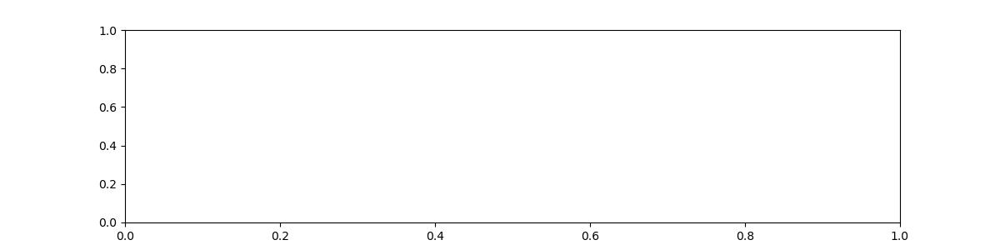

Output()

In [22]:
fig, ax = generate_updating_fig()

nr_iterations = 25
with generate_progress() as prog:
    task = prog.add_task(
        "[bold blue]Bayesian Optimization", total=nr_iterations, mean=0, sem=0
    )
    for i in range(nr_iterations):
        parameters, trial_index = ax_client.get_next_trial()
        ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

        idx = ax_client.get_best_trial(use_model_predictions=False)[0]
        # trial = ax_client.experiment.data_by_trial[idx]
        trial = list(ax_client.experiment.data_by_trial.values())[-1]
        trial_data = list(trial.values())[0].df
        prog.update(
            task,
            advance=1,
            mean=trial_data["mean"].values[0],
            sem=trial_data["sem"].values[0],
        )

        opt_trace = ax_client.get_optimization_trace()
        plot_progress(fig, ax, opt_trace)

    prog.refresh()

model = ax_client.generation_strategy.model

In [23]:
ax_client.generation_strategy.trials_as_df

[INFO 05-28 14:16:54] ax.modelbridge.generation_strategy: Note that parameter values in dataframe are rounded to 2 decimal points; the values in the dataframe are thus not the exact ones suggested by Ax in trials.


,Generation Step,Generation Model,Trial Index,Trial Status,Arm Parameterizations
0,0,Sobol,0,COMPLETED,"{'0_0': {'L': 0.67, 'V': 15444.31, 'R': 0.02}}"
1,0,Sobol,1,COMPLETED,"{'1_0': {'L': 0.49, 'V': 11887.97, 'R': 0.02}}"
2,0,Sobol,2,COMPLETED,"{'2_0': {'L': 0.17, 'V': 28047.78, 'R': 0.02}}"
3,0,Sobol,3,COMPLETED,"{'3_0': {'L': 0.88, 'V': 1162.93, 'R': 0.02}}"
4,0,Sobol,4,COMPLETED,"{'4_0': {'L': 0.96, 'V': 24247.09, 'R': 0.02}}"
5,0,Sobol,5,COMPLETED,"{'5_0': {'L': 0.31, 'V': 4725.78, 'R': 0.02}}"
6,0,Sobol,6,COMPLETED,"{'6_0': {'L': 0.35, 'V': 19038.05, 'R': 0.02}}"
7,0,Sobol,7,COMPLETED,"{'7_0': {'L': 0.58, 'V': 8063.26, 'R': 0.02}}"
8,0,Sobol,8,COMPLETED,"{'8_0': {'L': 0.64, 'V': 28168.86, 'R': 0.02}}"
9,0,Sobol,9,COMPLETED,"{'9_0': {'L': 0.4, 'V': 2682.91, 'R': 0.02}}"


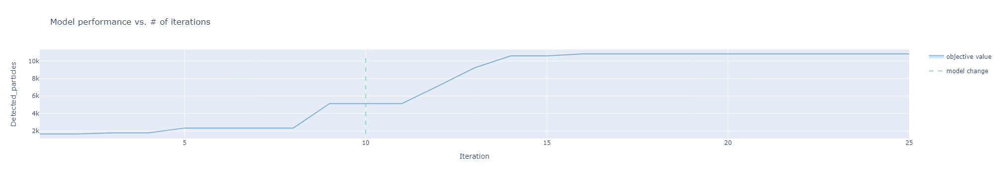

In [24]:
render(ax_client.get_optimization_trace())

In [25]:
best_parameters, values = ax_client.get_best_parameters()
best_parameters

{'L': 0.6417341331586309, 'V': 22594.619374961512, 'R': 0.022224999999999998}

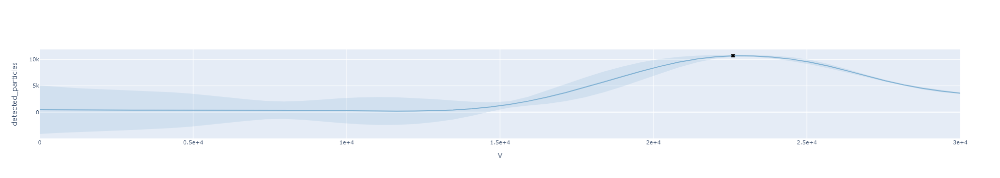

In [26]:
from ax.plot.slice import plot_slice

model = ax_client.generation_strategy.model
render(plot_slice(model, "V", "detected_particles", slice_values=best_parameters))

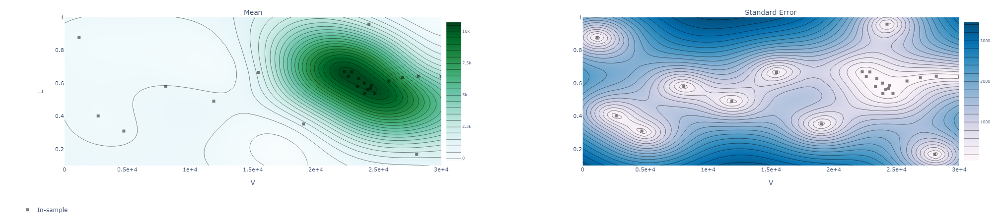

In [27]:
# this could alternately be done with `ax.plot.contour.plot_contour`
render(
    ax_client.get_contour_plot(
        param_x="V", param_y="L", metric_name="detected_particles"
    )
)

In [28]:
ax_client = AxClient(verbose_logging=False)
ax_client.create_experiment(
    name="optimize CeNTREX lens",
    parameters=[
        {"name": "L", "type": "range", "bounds": [0.1, 1.0], "value_type": "float"},
        {"name": "V", "type": "range", "bounds": [0, 30e3], "value_type": "float"},
        {
            "name": "R",
            "type": "range",
            "bounds": [1 * 0.0254 / 2, 2 * 0.0254 / 2],
            "value_type": "float",
        },
    ],
    objective_name="detected_particles",
    minimize=False,
)

[INFO 05-28 14:16:55] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='L', parameter_type=FLOAT, range=[0.1, 1.0]), RangeParameter(name='V', parameter_type=FLOAT, range=[0.0, 30000.0]), RangeParameter(name='R', parameter_type=FLOAT, range=[0.0127, 0.0254])], parameter_constraints=[]).
[INFO 05-28 14:16:55] ax.modelbridge.dispatch_utils: Using Bayesian optimization since there are more ordered parameters than there are categories for the unordered categorical parameters.
[INFO 05-28 14:16:55] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 6 trials, GPEI for subsequent trials]). Iterations after 6 will take longer to generate due to  model-fitting.


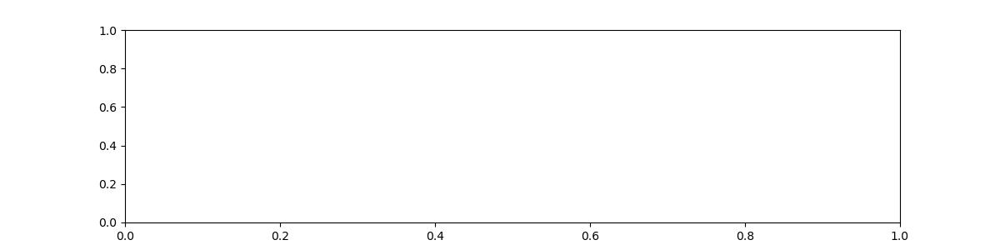

Output()

In [29]:
fig, ax = generate_updating_fig()

nr_iterations = 35
with generate_progress() as prog:
    task = prog.add_task(
        "[bold blue]Bayesian Optimization", total=nr_iterations, mean=0, sem=0
    )
    for i in range(nr_iterations):
        parameters, trial_index = ax_client.get_next_trial()
        ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

        idx = ax_client.get_best_trial(use_model_predictions=False)[0]
        # trial = ax_client.experiment.data_by_trial[idx]
        trial = list(ax_client.experiment.data_by_trial.values())[-1]
        trial_data = list(trial.values())[0].df
        prog.update(
            task,
            advance=1,
            mean=trial_data["mean"].values[0],
            sem=trial_data["sem"].values[0],
        )

        opt_trace = ax_client.get_optimization_trace()
        plot_progress(fig, ax, opt_trace)

    prog.refresh()

model = ax_client.generation_strategy.model

In [30]:
ax_client.generation_strategy.trials_as_df

[INFO 05-28 14:26:53] ax.modelbridge.generation_strategy: Note that parameter values in dataframe are rounded to 2 decimal points; the values in the dataframe are thus not the exact ones suggested by Ax in trials.


,Generation Step,Generation Model,Trial Index,Trial Status,Arm Parameterizations
0,0,Sobol,0,COMPLETED,"{'0_0': {'L': 0.38, 'V': 6428.89, 'R': 0.02}}"
1,0,Sobol,1,COMPLETED,"{'1_0': {'L': 0.29, 'V': 25902.55, 'R': 0.02}}"
2,0,Sobol,2,COMPLETED,"{'2_0': {'L': 0.89, 'V': 15794.18, 'R': 0.02}}"
3,0,Sobol,3,COMPLETED,"{'3_0': {'L': 0.37, 'V': 6159.88, 'R': 0.02}}"
4,0,Sobol,4,COMPLETED,"{'4_0': {'L': 0.87, 'V': 3313.19, 'R': 0.02}}"
5,0,Sobol,5,COMPLETED,"{'5_0': {'L': 0.55, 'V': 9504.02, 'R': 0.02}}"
6,1,GPEI,6,COMPLETED,"{'6_0': {'L': 0.21, 'V': 30000.0, 'R': 0.02}}"
7,1,GPEI,7,COMPLETED,"{'7_0': {'L': 0.1, 'V': 30000.0, 'R': 0.02}}"
8,1,GPEI,8,COMPLETED,"{'8_0': {'L': 0.12, 'V': 30000.0, 'R': 0.02}}"
9,1,GPEI,9,COMPLETED,"{'9_0': {'L': 0.29, 'V': 29635.25, 'R': 0.02}}"


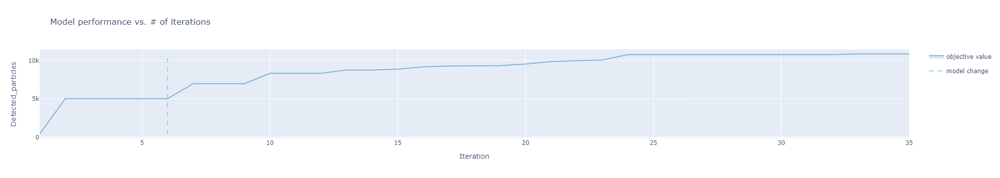

In [31]:
render(ax_client.get_optimization_trace())

In [32]:
best_parameters, values = ax_client.get_best_parameters()
best_parameters

{'L': 0.5313241241587983, 'V': 21660.414687957134, 'R': 0.020494457716587033}

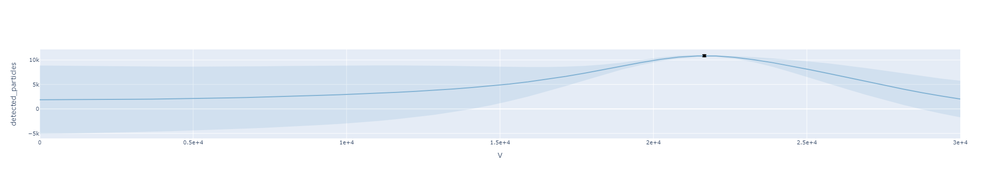

In [33]:
from ax.plot.slice import plot_slice

model = ax_client.generation_strategy.model
render(plot_slice(model, "V", "detected_particles", slice_values=best_parameters))

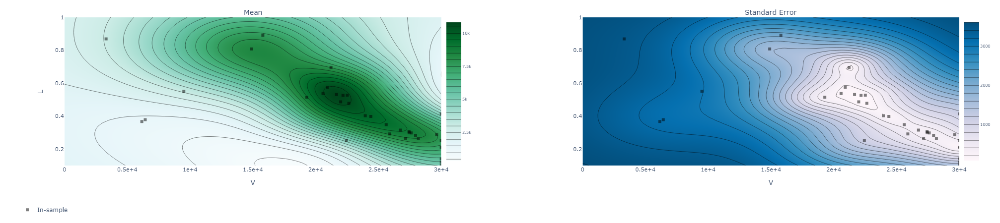

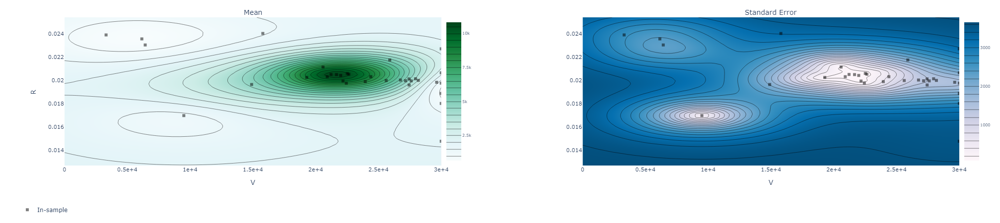

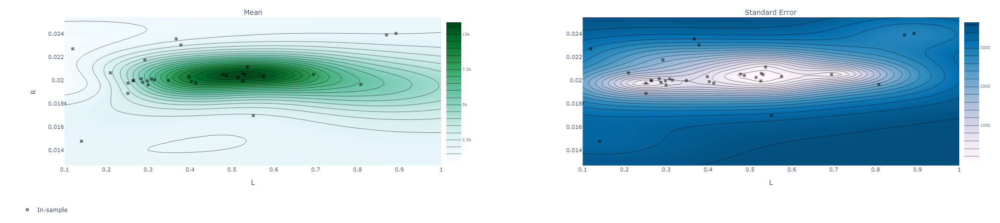

In [34]:
render(
    plot.contour.plot_contour(
        model, "V", "L", metric_name="detected_particles", slice_values=best_parameters
    )
)
render(
    plot.contour.plot_contour(
        model, "V", "R", metric_name="detected_particles", slice_values=best_parameters
    )
)
render(
    plot.contour.plot_contour(
        model, "L", "R", metric_name="detected_particles", slice_values=best_parameters
    )
)

In [35]:
import torch
from ax.modelbridge import get_sobol

ax_client = AxClient(verbose_logging=False)
ax_client.create_experiment(
    name="optimize CeNTREX lens",
    parameters=[
        {"name": "L", "type": "range", "bounds": [0.1, 1.0], "value_type": "float"},
        {"name": "V", "type": "range", "bounds": [0, 30e3], "value_type": "float"},
        {
            "name": "R",
            "type": "range",
            "bounds": [1 * 0.0254 / 2, 2 * 0.0254 / 2],
            "value_type": "float",
        },
    ],
    objective_name="detected_particles",
    minimize=False,
)

sobol = get_sobol(ax_client.experiment.search_space)
mc_points = sobol.gen(1024).param_df.values
mcp = torch.tensor(mc_points)

from botorch.acquisition.active_learning import qNegIntegratedPosteriorVariance


def get_qNIPV(
    model,
    **kwargs,
):
    return qNegIntegratedPosteriorVariance(model=model, mc_points=mcp)

[INFO 05-28 14:26:55] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='L', parameter_type=FLOAT, range=[0.1, 1.0]), RangeParameter(name='V', parameter_type=FLOAT, range=[0.0, 30000.0]), RangeParameter(name='R', parameter_type=FLOAT, range=[0.0127, 0.0254])], parameter_constraints=[]).
[INFO 05-28 14:26:55] ax.modelbridge.dispatch_utils: Using Bayesian optimization since there are more ordered parameters than there are categories for the unordered categorical parameters.
[INFO 05-28 14:26:55] ax.modelbridge.dispatch_utils: Using Bayesian Optimization generation strategy: GenerationStrategy(name='Sobol+GPEI', steps=[Sobol for 6 trials, GPEI for subsequent trials]). Iterations after 6 will take longer to generate due to  model-fitting.


In [36]:
gs = GenerationStrategy(
    steps=[
        # 1. Initialization step (does not require pre-existing data and is well-suited for
        # initial sampling of the search space)
        GenerationStep(
            model=Models.SOBOL,
            num_trials=10,  # How many trials should be produced from this generation step
            min_trials_observed=3,  # How many trials need to be completed to move to next model
            max_parallelism=5,  # Max parallelism for this step
            model_kwargs={"seed": 999},  # Any kwargs you want passed into the model
            model_gen_kwargs={},  # Any kwargs you want passed to `modelbridge.gen`
        ),
        # 2. Bayesian optimization step (requires data obtained from previous phase and learns
        # from all data available at the time of each new candidate generation call)
        GenerationStep(
            model=Models.GPEI,
            num_trials=15,
            max_parallelism=3,  # Parallelism limit for this step, often lower than for Sobol
            # More on parallelism vs. required samples in BayesOpt:
            # https://ax.dev/docs/bayesopt.html#tradeoff-between-parallelism-and-total-number-of-trials
        ),
        # exploration
        GenerationStep(
            model=Models.BOTORCH,
            num_trials=20,
            model_kwargs={"acqf_constructor": get_qNIPV, "kwargs": [mc_points, "sil"]},
        ),
        GenerationStep(
            model=Models.GPEI,
            num_trials=20,  # No limitation on how many trials should be produced from this step
            max_parallelism=3,  # Parallelism limit for this step, often lower than for Sobol
            # More on parallelism vs. required samples in BayesOpt:
            # https://ax.dev/docs/bayesopt.html#tradeoff-between-parallelism-and-total-number-of-trials
        ),
        # exploration
        GenerationStep(
            model=Models.BOTORCH,
            num_trials=-1,
            model_kwargs={"acqf_constructor": get_qNIPV, "kwargs": [mc_points, "sil"]},
        ),
    ]
)
ax_client = AxClient(generation_strategy=gs, verbose_logging=False)
ax_client.create_experiment(
    name="optimize CeNTREX lens",
    parameters=[
        {"name": "L", "type": "range", "bounds": [0.1, 1.0], "value_type": "float"},
        {"name": "V", "type": "range", "bounds": [0, 30e3], "value_type": "float"},
        {
            "name": "R",
            "type": "range",
            "bounds": [1 * 0.0254 / 2, 2 * 0.0254 / 2],
            "value_type": "float",
        },
    ],
    objective_name="detected_particles",
    minimize=False,
)

[INFO 05-28 14:26:56] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='L', parameter_type=FLOAT, range=[0.1, 1.0]), RangeParameter(name='V', parameter_type=FLOAT, range=[0.0, 30000.0]), RangeParameter(name='R', parameter_type=FLOAT, range=[0.0127, 0.0254])], parameter_constraints=[]).


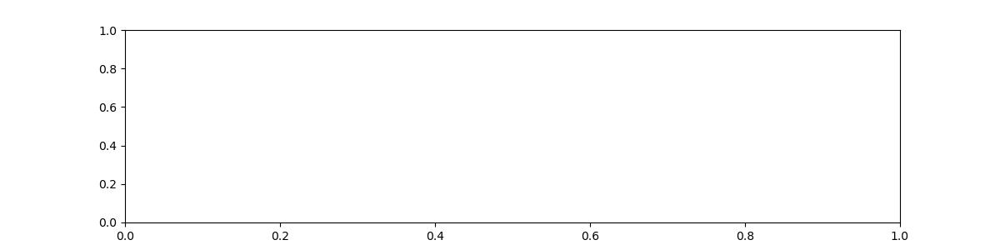

Output()

In [37]:
fig, ax = generate_updating_fig()

nr_iterations = 100
with generate_progress() as prog:
    task = prog.add_task(
        "[bold blue]Bayesian Optimization", total=nr_iterations, mean=0, sem=0
    )
    for i in range(nr_iterations):
        parameters, trial_index = ax_client.get_next_trial()
        ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

        idx = ax_client.get_best_trial(use_model_predictions=False)[0]
        # trial = ax_client.experiment.data_by_trial[idx]
        trial = list(ax_client.experiment.data_by_trial.values())[-1]
        trial_data = list(trial.values())[0].df
        prog.update(
            task,
            advance=1,
            mean=trial_data["mean"].values[0],
            sem=trial_data["sem"].values[0],
        )

        opt_trace = ax_client.get_optimization_trace()
        plot_progress(fig, ax, opt_trace)

    prog.refresh()

model = ax_client.generation_strategy.model

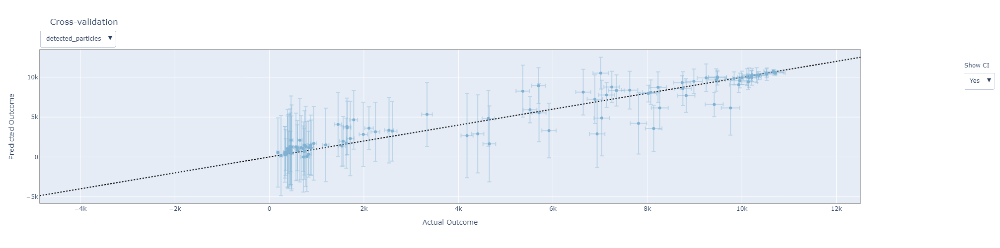

In [38]:
cv_results = cross_validate(model)
render(interact_cross_validation(cv_results))

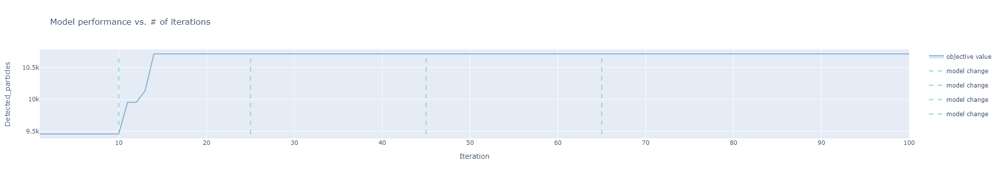

In [39]:
render(ax_client.get_optimization_trace())

In [40]:
best_parameters, values = ax_client.get_best_parameters()
best_parameters

{'L': 0.5358766681525449, 'V': 18762.017631929466, 'R': 0.019080845233027898}

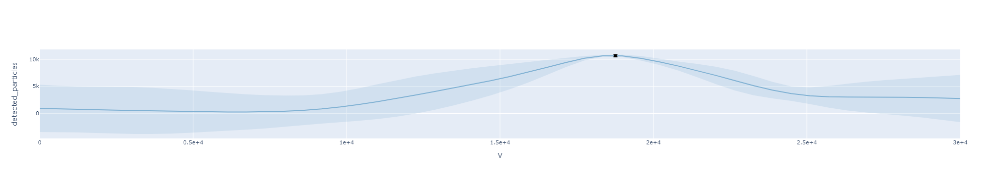

In [41]:
from ax.plot.slice import plot_slice

model = ax_client.generation_strategy.model
render(plot_slice(model, "V", "detected_particles", slice_values=best_parameters))

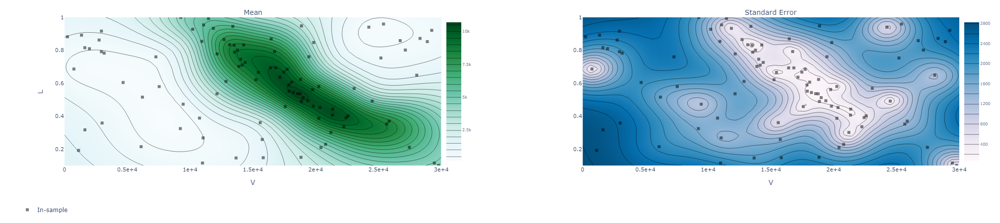

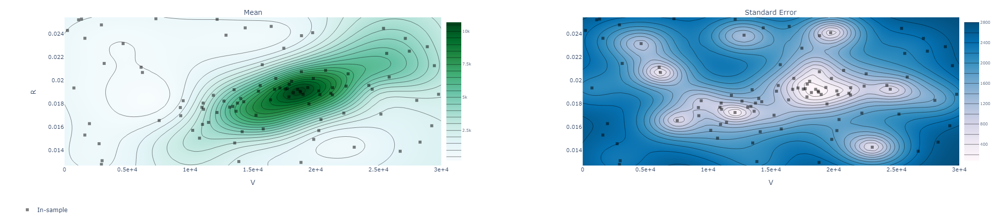

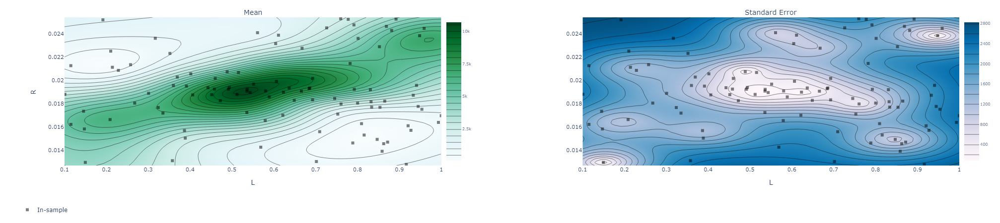

In [42]:
render(
    plot.contour.plot_contour(
        model, "V", "L", metric_name="detected_particles", slice_values=best_parameters
    )
)
render(
    plot.contour.plot_contour(
        model, "V", "R", metric_name="detected_particles", slice_values=best_parameters
    )
)
render(
    plot.contour.plot_contour(
        model, "L", "R", metric_name="detected_particles", slice_values=best_parameters
    )
)

In [43]:
ax_client.get_trials_data_frame()

,detected_particles,trial_index,arm_name,L,V,R,trial_status,generation_method
0,9458.0,0,0_0,0.665857,15444.307923,0.019068,COMPLETED,Sobol
3,715.0,1,1_0,0.323961,9227.124285,0.017667,COMPLETED,Sobol
15,5706.0,2,2_0,0.351912,25657.282406,0.022311,COMPLETED,Sobol
27,447.0,3,3_0,0.862554,2757.280888,0.014573,COMPLETED,Sobol
39,874.0,4,4_0,0.920834,29244.925361,0.016110,COMPLETED,Sobol
...,...,...,...,...,...,...,...,...
94,7034.0,95,95_0,0.959116,25405.616881,0.024457,COMPLETED,BO
95,937.0,96,96_0,0.579541,7541.935863,0.016549,COMPLETED,BO
96,6936.0,97,97_0,0.948357,18872.012319,0.023825,COMPLETED,BO
97,884.0,98,98_0,0.145613,13663.931787,0.017354,COMPLETED,BO
